# Calibration using Zhang's procedure

In [23]:
from matplotlib import pyplot as plt
import os
import numpy as np
import cv2 # OpenCV
from calibration import Calibrator

## 1. Calibrate using Zhang procedure, i.e., find the intrinsic parameters K and, for each image, the pair of R, t (extrinsic);

In [24]:
calibrator = Calibrator()

folderpath = './images'
images_path = [os.path.join(folderpath, imagename) for imagename in os.listdir(folderpath) if imagename.endswith(".tiff")]
images_path.sort()
limages = []

for path in images_path:
    image = cv2.imread(path)
    limages.append(image)


calibrator.fit(limages, radial_distortion=False, iterative=False)
print("K:",calibrator.K)
print("Rotation matrices:")
for i,R in enumerate(calibrator.rotations):
    print(f"R{i+1}:{R}")
print("Translation vectors:")
for i,t in enumerate(calibrator.translations):
    print(f"t{i+1}:{t}")
print(calibrator.projection_matrices[7])

K: [[1.74328298e+03 1.06689998e+00 6.31571246e+02]
 [0.00000000e+00 1.74372132e+03 4.97138664e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Rotation matrices:
R1:[[-0.33772294  0.91186197 -0.2333473 ]
 [ 0.94007421  0.33913722 -0.03530484]
 [ 0.04694361 -0.23128704 -0.97175234]]
R2:[[ 0.88161727 -0.41253799  0.2292671 ]
 [-0.46352319 -0.84829173  0.25602227]
 [ 0.08886647 -0.33198427 -0.93908956]]
R3:[[-0.54238486  0.67879515 -0.49503112]
 [ 0.81125694  0.57631479 -0.09860753]
 [ 0.21835944 -0.45508066 -0.86326169]]
R4:[[ 0.85856787 -0.47068569  0.20326384]
 [-0.49754226 -0.86059693  0.10874112]
 [ 0.12374535 -0.19449398 -0.97306689]]
R5:[[ 0.72265179 -0.65130342  0.23146974]
 [-0.67740131 -0.73392983  0.04974412]
 [ 0.13748403 -0.19274558 -0.97156949]]
R6:[[-0.1449447   0.96152641 -0.23336237]
 [ 0.92427094  0.2157585   0.31491508]
 [ 0.35314908 -0.17004478 -0.91998397]]
R7:[[-0.43544909  0.88351679 -0.17257512]
 [ 0.87187339  0.46164157  0.1634743 ]
 [ 0.22410014 -0.07927892 

## 2. Choose one of the calibration images and compute the total reprojection error for all the grid points (adding a figure with the reprojected points);
We will perform the procedure on the 8-th image, first with the basic procedure then with the iterative one
### Basic procedure

Text(0.5, 1.0, 'Total reprojection error: 2.34461332216495')

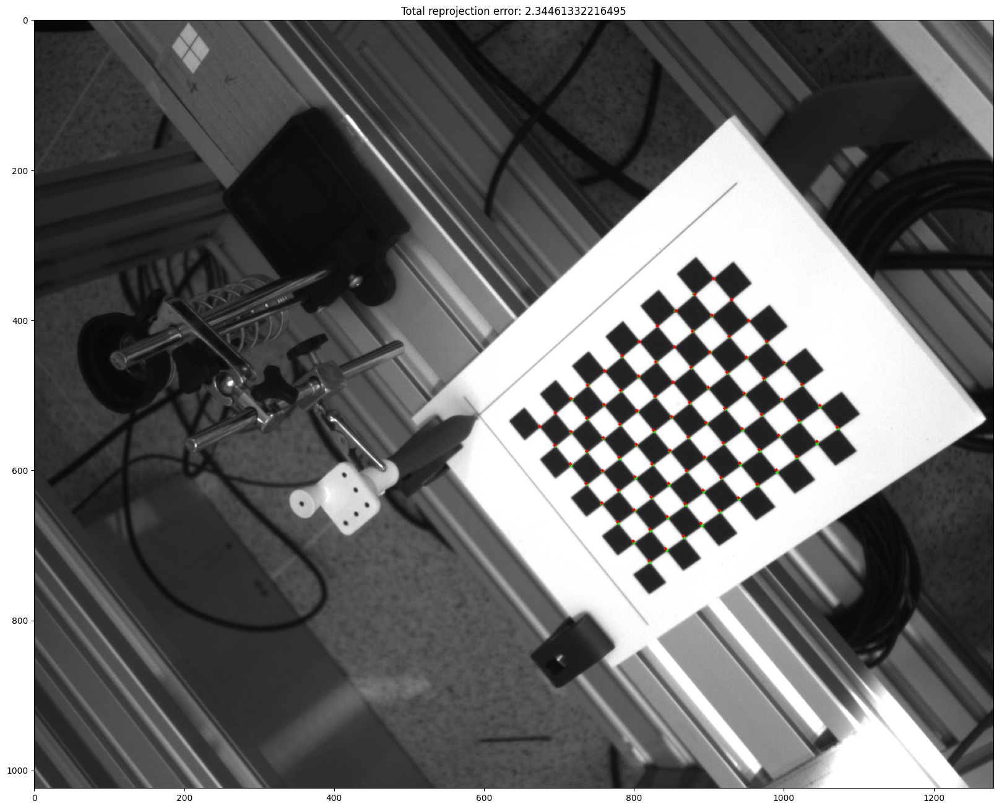

In [25]:
index = 7

calibrator.fit(limages, radial_distortion=False, iterative=False)
R, P, error = calibrator.real_coords, calibrator.projection_matrices[index], calibrator.reprojection_errors[index]
image7 = cv2.imread(images_path[index])
proj_chess = np.transpose(P@R.T)
proj_chess[:,0] = proj_chess[:,0]/proj_chess[:,2]
proj_chess[:,1] = proj_chess[:,1]/proj_chess[:,2]
proj_chess = proj_chess[:,:-1]
copy1 = image7.copy()
for point in calibrator.pix_coords[index]:
    copy2 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(point, dtype=np.int32)),
                           color=(0,255,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )

copy2= copy1.copy()
for point in proj_chess:
    copy1 = cv2.drawMarker(img=copy2,
                           position=tuple(np.array(point, dtype=np.int32)),
                           color=(255,0,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )

noi_nor=calibrator.reprojection_errors

plt.figure(figsize=(20,20))
plt.imshow(copy2)
plt.title(f"Total reprojection error: {error}")

### Iterative refinement

[[-7.45739476e+02  1.07641663e+03 -1.36617091e+03  4.83464922e+02]
 [ 1.26257446e+03  1.34836293e+03  1.38434472e+02  1.83995387e+02]
 [ 5.61884570e-01 -6.86944382e-02 -8.24358419e-01  5.33197112e-01]]


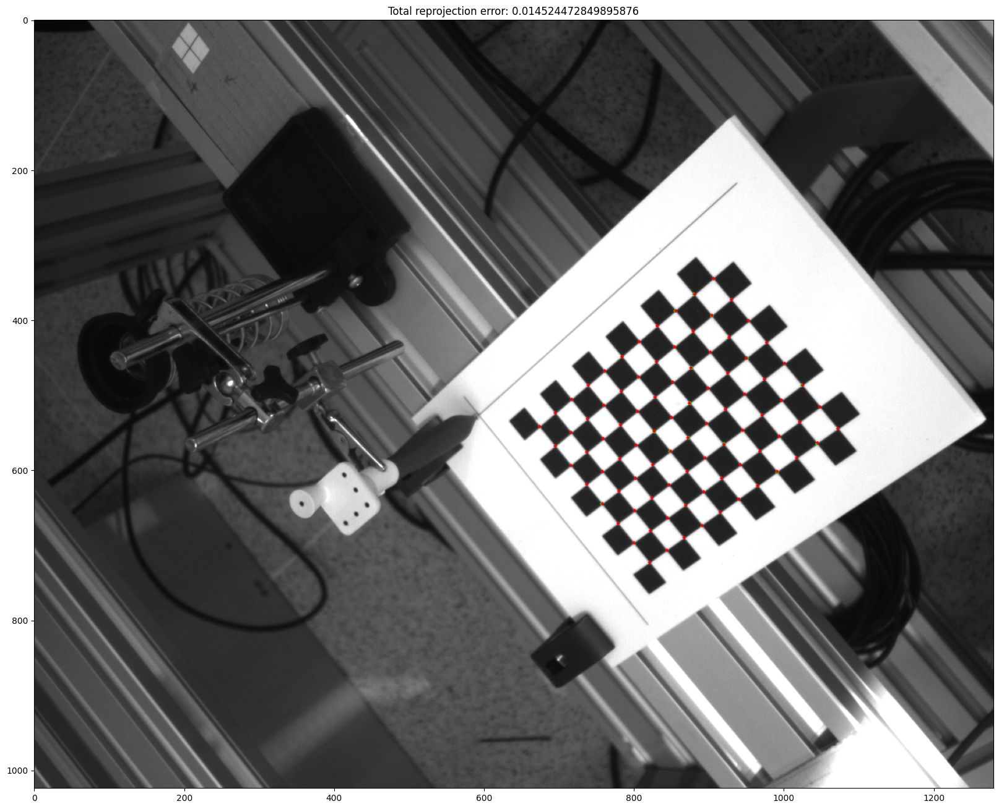

In [26]:
calibrator.fit(limages, radial_distortion=False, iterative=True)
R, P, error = calibrator.real_coords, calibrator.projection_matrices[index], calibrator.reprojection_errors[index]
image7 = cv2.imread(images_path[index])
proj_chess = np.transpose(P@R.T)
proj_chess[:,0] = proj_chess[:,0]/proj_chess[:,2]
proj_chess[:,1] = proj_chess[:,1]/proj_chess[:,2]
proj_chess = proj_chess[:,:-1]
copy1 = image7.copy()
for point in calibrator.pix_coords[index]:
    copy2 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(point, dtype=np.int32)),
                           color=(0,255,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )
    
copy2= copy1.copy()
for point in proj_chess:
    copy1 = cv2.drawMarker(img=copy2,
                           position=tuple(np.array(point, dtype=np.int32)),
                           color=(255,0,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )
i_nor=calibrator.reprojection_errors
plt.figure(figsize=(20,20))
plt.imshow(copy2)
plt.title(f"Total reprojection error: {error}")
print(calibrator.projection_matrices[7])

### Iterative refinement and distortion compensation

Text(0.5, 1.0, 'Total reprojection error: 0.014524472849895876')

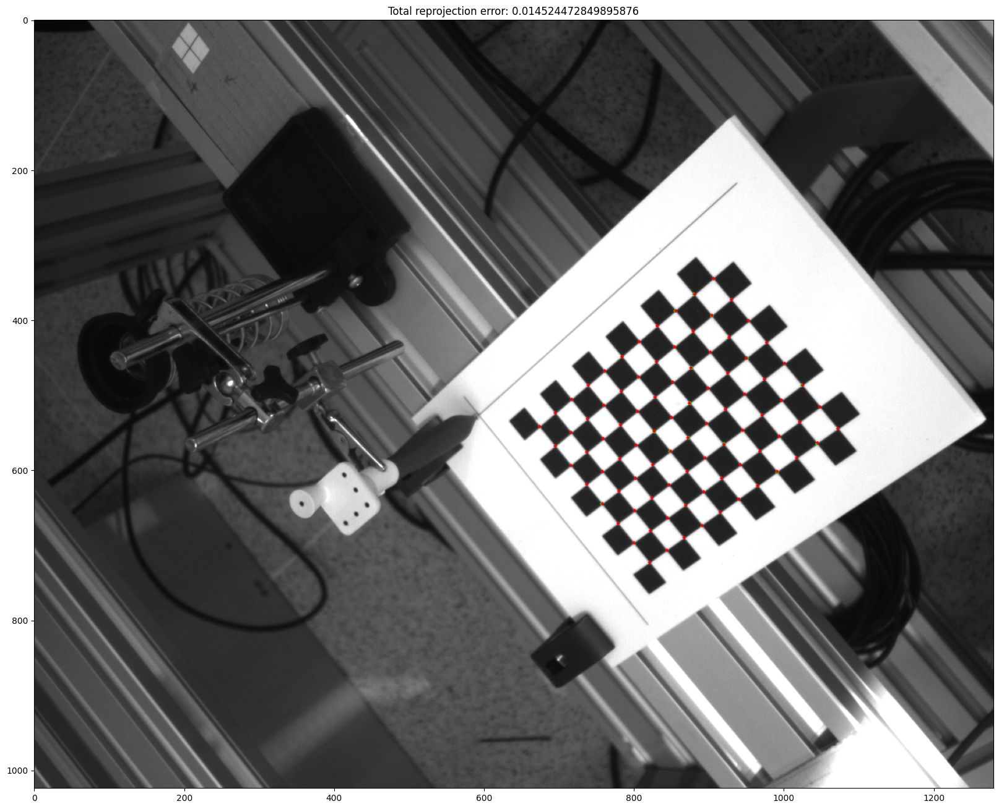

In [27]:
copy1 = image7.copy()
for point in calibrator.pix_coords[index]:
    copy2 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(point, dtype=np.int32)),
                           color=(0,255,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )
copy2= copy1.copy()
for point in proj_chess:
    distorted = calibrator.distort_coordinates(point[0], point[1])
    distorted = np.array(list(distorted))
    copy1 = cv2.drawMarker(img=copy2,
                           position=tuple(np.array(distorted, dtype=np.int32)),
                           color=(255,0,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )

plt.figure(figsize=(20,20))
plt.imshow(copy2)
plt.title(f"Total reprojection error: {error}")

### All in one

[np.float64(0.04645603832490308), np.float64(0.03867920542548516), np.float64(0.23141631220049233), np.float64(0.023722984261001664), np.float64(0.02726755889423876), np.float64(0.41031516081370223), np.float64(0.07568660965821546), np.float64(2.34461332216495), np.float64(0.13845865842151503), np.float64(0.09422953948455501), np.float64(0.05850329332418245), np.float64(0.11299707338528794), np.float64(0.08043372389994591), np.float64(0.14191927338499785), np.float64(0.1429411146057912), np.float64(0.23242462658535246), np.float64(0.6709295838238745), np.float64(0.5456564485917459), np.float64(0.11981672654480087), np.float64(0.19319318200933322)]
[np.float64(0.008014926094901063), np.float64(0.010168069683119119), np.float64(0.017341137939628905), np.float64(0.008348480845468683), np.float64(0.008299931712668098), np.float64(0.010492689095011925), np.float64(0.007936756966095457), np.float64(0.014524472849895876), np.float64(0.010914215691985439), np.float64(0.011733551082998846), np.

Text(0.5, 1.0, 'Total reprojection error: 0.015476516073130043')

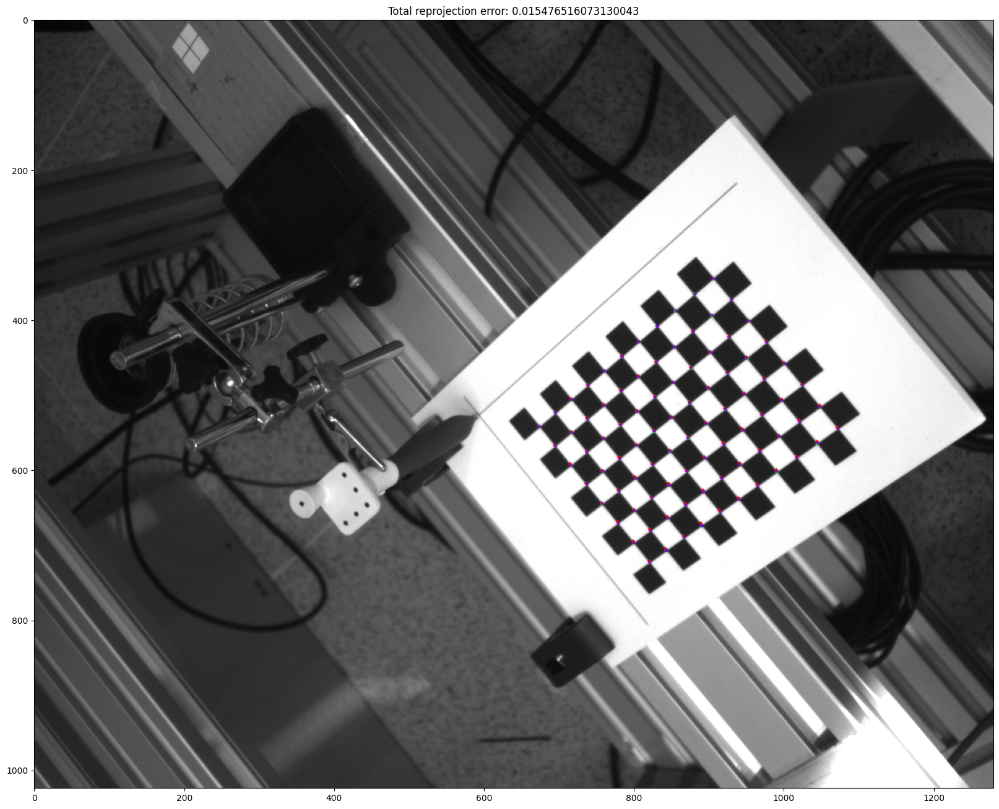

In [28]:
image_chosen = cv2.imread(images_path[index])
copy1 = image_chosen.copy()

# True coordinates
for point in calibrator.pix_coords[index]:
    copy1 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(point, dtype=np.int32)),
                           color=(0,255,0),
                           markerType=cv2.MARKER_CROSS,
                           thickness=3,
                           markerSize=1
                           )
    
# Algebraic minimization, no radial distortion
calibrator.fit(limages, radial_distortion=False, iterative=False)
print(calibrator.reprojection_errors)
R, P, error = calibrator.real_coords, calibrator.projection_matrices[index], calibrator.reprojection_errors[index]
proj_chess = np.transpose(P@R.T)
proj_chess[:,0] = proj_chess[:,0]/proj_chess[:,2]
proj_chess[:,1] = proj_chess[:,1]/proj_chess[:,2]
proj_chess = proj_chess[:,:-1]
for point in proj_chess:
    distorted = calibrator.distort_coordinates(point[0], point[1])
    distorted = np.array(list(distorted))
    copy1 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(distorted, dtype=np.int32)),
                           color=(255,0,0),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )
# Geometric minimization, no radial distortion
calibrator.fit(limages, radial_distortion=False, iterative=True)
print(calibrator.reprojection_errors)
R, P, error = calibrator.real_coords, calibrator.projection_matrices[index], calibrator.reprojection_errors[index]
proj_chess = np.transpose(P@R.T)
proj_chess[:,0] = proj_chess[:,0]/proj_chess[:,2]
proj_chess[:,1] = proj_chess[:,1]/proj_chess[:,2]
proj_chess = proj_chess[:,:-1]
for point in proj_chess:
    distorted = calibrator.distort_coordinates(point[0], point[1])
    distorted = np.array(list(distorted))
    copy1 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(distorted, dtype=np.int32)),
                           color=(0,0,255),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )
# Geometric minimization, radial distortion
calibrator.fit(limages, radial_distortion=True, iterative=True)
print(calibrator.reprojection_errors)
R, P, error = calibrator.real_coords, calibrator.projection_matrices[index], calibrator.reprojection_errors[index]
proj_chess = np.transpose(P@R.T)
proj_chess[:,0] = proj_chess[:,0]/proj_chess[:,2]
proj_chess[:,1] = proj_chess[:,1]/proj_chess[:,2]
proj_chess = proj_chess[:,:-1]
for point in proj_chess:
    distorted = calibrator.distort_coordinates(point[0], point[1])
    distorted = np.array(list(distorted))
    copy1 = cv2.drawMarker(img=copy1,
                           position=tuple(np.array(distorted, dtype=np.int32)),
                           color=(120,20,200),
                           markerType=cv2.MARKER_TILTED_CROSS,
                           thickness=3,
                           markerSize=1
                           )

plt.figure(figsize=(20,20))
plt.imshow(copy1)
plt.title(f"Total reprojection error: {error}")

## 3. Superimpose an object (for instance, a cylinder), to the calibration plane, in all the images employed for the calibration;

In [29]:
# Funzione generata con Microsoft Copilot
def create_image_grid(image_list, grid_size, is_bw=False):
    rows, cols = grid_size
    if len(image_list) != rows * cols:
        raise ValueError("Il numero di immagini non corrisponde alla dimensione della griglia")

    img_height, img_width = image_list[0].shape[:2]

    if not is_bw:
        grid_image = np.zeros((rows * img_height, cols * img_width, 3), dtype=np.uint8)
    else:
        grid_image = np.zeros((rows * img_height, cols * img_width), dtype=np.uint8)

    for idx, img in enumerate(image_list):
        row = idx // cols
        col = idx % cols
        grid_image[row * img_height:(row + 1) * img_height, col * img_width:(col + 1) * img_width] = img

    return grid_image

In [30]:
pts = cv2.ellipse2Poly((44,55), (22,22), 0, 0, 360, 1)
pts = pts/1000
et_low = np.empty_like(pts)
et_high = np.empty_like(et_low)
pts_low = np.hstack((pts, np.zeros((pts.shape[0],1)), np.ones((pts.shape[0],1))))
pts_high = np.hstack((pts, np.full((pts.shape[0],1), 0.055), np.ones((pts.shape[0],1))))

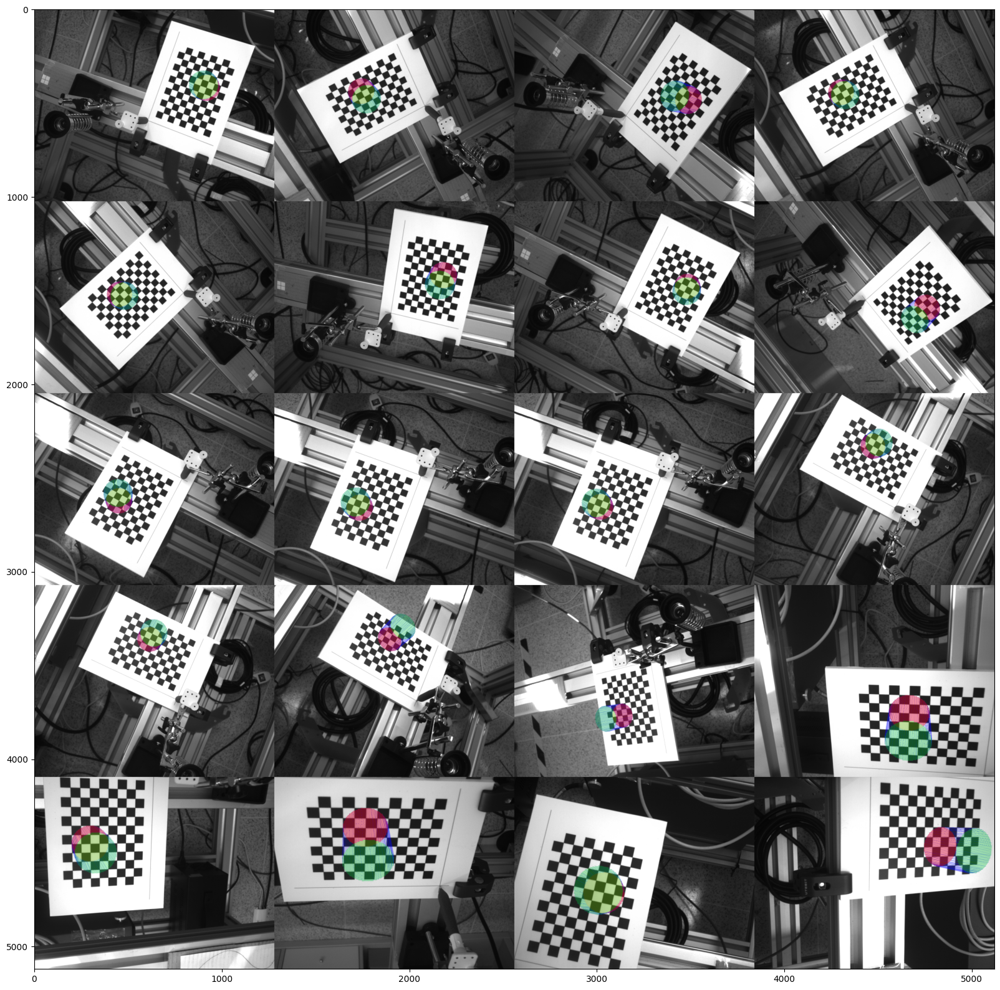

In [31]:
image_list = []
for i,path in enumerate(images_path):
    original = cv2.imread(path)
    P = calibrator.projection_matrices[i]

    proj_low = np.transpose(P @ pts_low.T)
    et_low[:,0] = proj_low[:,0]/proj_low[:,2]
    et_low[:,1] = proj_low[:,1]/proj_low[:,2]

    proj_high = np.transpose(P @ pts_high.T)
    et_high[:,0] = proj_high[:,0]/proj_high[:,2]
    et_high[:,1] = proj_high[:,1]/proj_high[:,2]

    img2 = original.copy()
    img2 = cv2.fillConvexPoly(img2,np.array(et_low, dtype=np.int32),(255,0,0))
    img3 = cv2.fillConvexPoly(img2.copy(),np.array(et_high, dtype=np.int32),(0,255,0))
    img4 = original.copy()
    for i in range(et_low.shape[0]):
        img4 = cv2.line(img4, tuple(np.array(et_low[i], dtype=np.int32)), tuple(np.array(et_high[i], dtype=np.int32)),(0,0,255))
    img2 = cv2.addWeighted(img2, 0.5, original, 0.5, 0)
    img3 = cv2.addWeighted(img2, 0.5, img3, 0.5, 0)
    img4 = cv2.addWeighted(img3, 0.5, img4, 0.5, 0)
    image_list.append(img4)

compound = create_image_grid(image_list, (5,4))
plt.figure(figsize=(20,20))
plt.imshow(compound)

[np.float64(0.008758338169957008), np.float64(0.010196392443598686), np.float64(0.014463191558515259), np.float64(0.009344256532768404), np.float64(0.008985469794874133), np.float64(0.009316233059929058), np.float64(0.008086541276286054), np.float64(0.015476516073130043), np.float64(0.010002022171448648), np.float64(0.011276040395549927), np.float64(0.009978346976411593), np.float64(0.01196629749162627), np.float64(0.012557582300731913), np.float64(0.02274188723519324), np.float64(0.014020466054917845), np.float64(0.036345182871471086), np.float64(0.020883299376328098), np.float64(0.052036328659619824), np.float64(0.024472970408408876), np.float64(0.03631776717758564)]
[[  3   3   0 ... 243 243 245]
 [254 255 254 ...   0   3   5]
 [  1   1   1 ...   3 250   3]
 ...
 [  7   2 254 ...   3 253   2]
 [ 10  10   6 ...   1 253 254]
 [  2   5   3 ... 251 252 246]] 0 255


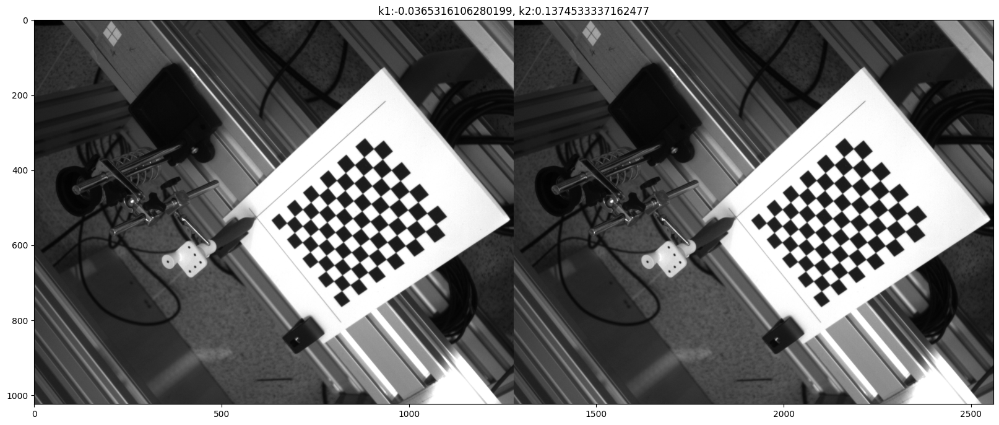

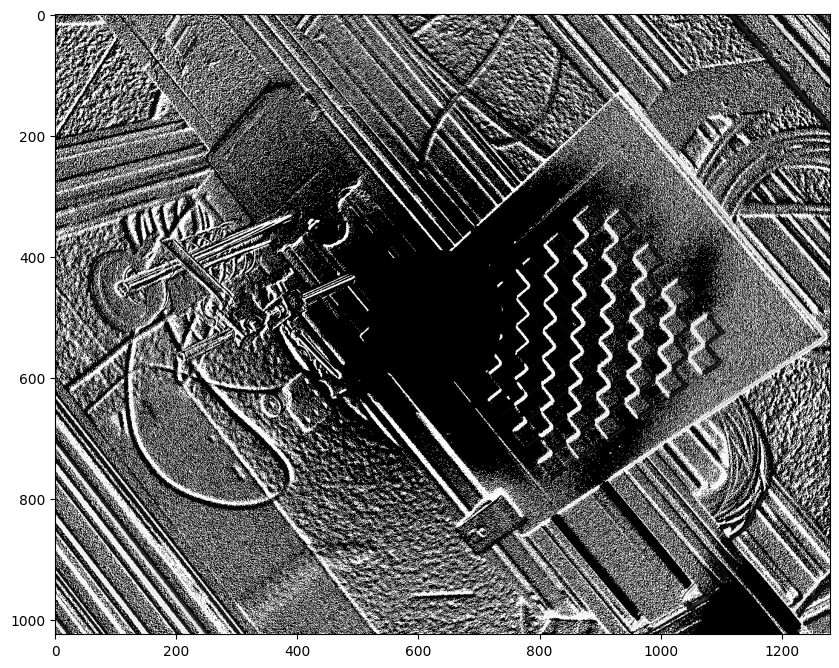

In [32]:
calibrator.fit(limages, radial_distortion=True, iterative=True)
print(calibrator.reprojection_errors)
image7 = cv2.imread(images_path[index])
image7 = cv2.cvtColor(image7.copy(), cv2.COLOR_BGR2GRAY)
undistorted7 = calibrator.compensate_radial_distortion(image7)
limage1 = [image7, undistorted7]
compound = create_image_grid(limage1, (1,2), True)
diff = image7 - undistorted7
ir = calibrator.reprojection_errors
print(diff, np.min(diff), np.max(diff))
plt.figure(figsize=(20,20))
plt.imshow(compound, cmap='gray')
plt.title(f"k1:{calibrator.distortion_parameters[0]}, k2:{calibrator.distortion_parameters[1]}")

plt.figure(figsize=(10,10))
plt.imshow(diff, cmap='gray')

[np.float64(0.04645603832490308), np.float64(0.03867920542548516), np.float64(0.23141631220049233), np.float64(0.023722984261001664), np.float64(0.02726755889423876), np.float64(0.41031516081370223), np.float64(0.07568660965821546), np.float64(2.34461332216495), np.float64(0.13845865842151503), np.float64(0.09422953948455501), np.float64(0.05850329332418245), np.float64(0.11299707338528794), np.float64(0.08043372389994591), np.float64(0.14191927338499785), np.float64(0.1429411146057912), np.float64(0.23242462658535246), np.float64(0.6709295838238745), np.float64(0.5456564485917459), np.float64(0.11981672654480087), np.float64(0.19319318200933322)]
[np.float64(0.008014926094901063), np.float64(0.010168069683119119), np.float64(0.017341137939628905), np.float64(0.008348480845468683), np.float64(0.008299931712668098), np.float64(0.010492689095011925), np.float64(0.007936756966095457), np.float64(0.014524472849895876), np.float64(0.010914215691985439), np.float64(0.011733551082998846), np.

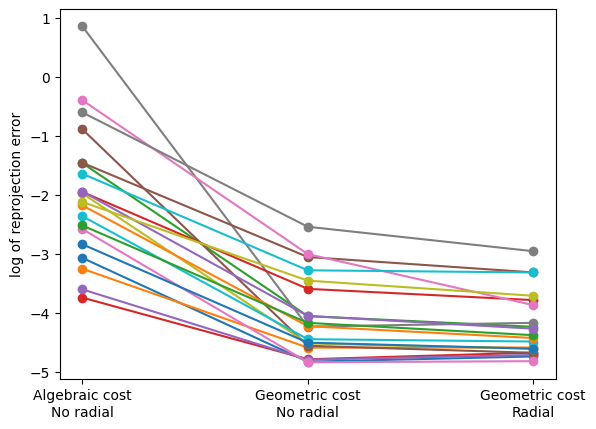

In [33]:
print(noi_nor)
print(i_nor)
print(ir)

for i in range(len(ir)):
    plt.plot([0, 1, 2], [np.log(noi_nor[i]), np.log(i_nor[i]), np.log(ir[i])], 'o-')
    plt.xticks(ticks=[0, 1, 2], labels=['Algebraic cost\nNo radial', 'Geometric cost\nNo radial', 'Geometric cost\nRadial'])
    plt.ylabel('log of reprojection error')